# AAL3 for ADNI patients; comparison CN --> EMCI --> LMCI --> AD

All the imports and installs we'll need.


In [1]:
import os
#import torch
#from torch import nn
import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

import numpy as np
import matplotlib.pyplot as plt
#from tqdm import tqdm

from nilearn import datasets
from nilearn import plotting
from nilearn.input_data import NiftiMapsMasker
from nilearn.connectome import ConnectivityMeasure

#import torch.nn.functional as F
#from torch.nn import Sequential, Linear, ReLU, GRU, BatchNorm1d
#from torch_geometric.nn import EdgeConv, GCNConv, GraphConv
#from torch_geometric.nn import global_mean_pool
#from torch_geometric.data import InMemoryDataset, Data, DataLoader
#from torch_geometric.utils import from_networkx

#import networkx as nx
#from networkx.convert_matrix import from_numpy_matrix

In [2]:


# AAL3

import numpy as np
import matplotlib.pyplot as plt
from nilearn import datasets, plotting, input_data
import nibabel as nib

# Path to your downloaded AAL3 atlas NIfTI file
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'

# Path to your downloaded AAL3 labels file (e.g., CSV or TXT)
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the labels
with open(aal3_labels_filename, 'r') as f:
    roi_names = [line.strip() for line in f]
    roi_labels = [line.strip() for line in f]
    print("roi name :", roi_names)
    #print("roi label :", roi_labels)


# Create a masker using NiftiLabelsMasker

# Just for demonstration, let's plot the atlas regions
#atlas_img = nib.load(aal3_atlas_filename)

# Plot the AAL3 atlas
#plotting.plot_roi(atlas_img, title='AAL3 Atlas')

#plt.show()


roi name : ['1 Precentral_L 1', '2 Precentral_R 2', '3 Frontal_Sup_2_L 3', '4 Frontal_Sup_2_R 4', '5 Frontal_Mid_2_L 5', '6 Frontal_Mid_2_R 6', '7 Frontal_Inf_Oper_L 7', '8 Frontal_Inf_Oper_R 8', '9 Frontal_Inf_Tri_L 9', '10 Frontal_Inf_Tri_R 10', '11 Frontal_Inf_Orb_2_L 11', '12 Frontal_Inf_Orb_2_R 12', '13 Rolandic_Oper_L 13', '14 Rolandic_Oper_R 14', '15 Supp_Motor_Area_L 15', '16 Supp_Motor_Area_R 16', '17 Olfactory_L 17', '18 Olfactory_R 18', '19 Frontal_Sup_Medial_L 19', '20 Frontal_Sup_Medial_R 20', '21 Frontal_Med_Orb_L 21', '22 Frontal_Med_Orb_R 22', '23 Rectus_L 23', '24 Rectus_R 24', '25 OFCmed_L 25', '26 OFCmed_R 26', '27 OFCant_L 27', '28 OFCant_R 28', '29 OFCpost_L 29', '30 OFCpost_R 30', '31 OFClat_L 31', '32 OFClat_R 32', '33 Insula_L 33', '34 Insula_R 34', '35 Cingulate_Ant_L', '36 Cingulate_Ant_R', '37 Cingulate_Mid_L 37', '38 Cingulate_Mid_R 38', '39 Cingulate_Post_L 39', '40 Cingulate_Post_R 40', '41 Hippocampus_L 41', '42 Hippocampus_R 42', '43 ParaHippocampal_L 43

In [3]:
import os
import numpy as np
import nibabel as nib
from nilearn import datasets, input_data, connectome
import matplotlib.pyplot as plt
import dicom2nifti
import dicom2nifti.settings as settings
import pydicom

In [4]:

# WITH the AAL3 atlas

# CN, control person

# Define the directory containing DICOM files
dicom_folder = "/Users/mariamannone/Downloads/ADNI 8/018_S_4399/Resting_State_fMRI/2012-05-02_09_34_28.0/I301492"

# Define the output folder for NIfTI files
output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_CN"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]

# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)


/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01845971575420981290'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03063941057727378469'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.01828170601242247690'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

In [50]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_CN/output.nii.gz/501_resting_state_fmri.nii.gz"

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]

# to check which ROIs are missing:

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Identify all ROIs from the atlas
all_rois = np.arange(len(roi_names))

# Determine missing ROIs
missing_rois = np.setdiff1d(all_rois, non_empty_indices)

# Print the missing ROIs
print("Missing ROIs indices:", missing_rois)
print("Missing ROIs names:", [roi_names[i] for i in missing_rois])

Missing ROIs indices: [166 167 168 169]
Missing ROIs names: ['167 LC_L 167', '168 LC_R 168', '169 Raphe_D 169', '170 Raphe_M 170']


In [5]:
# Filtering them out:
# considering also the other
rois_to_filter_out = [166, 167, 168, 169, 106, 111, 121, 133, 134, 164, 170, 161, 162, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169]

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_CN/output.nii.gz/501_resting_state_fmri.nii.gz"

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]


In [6]:
CN_matrix = connectivity_matrix

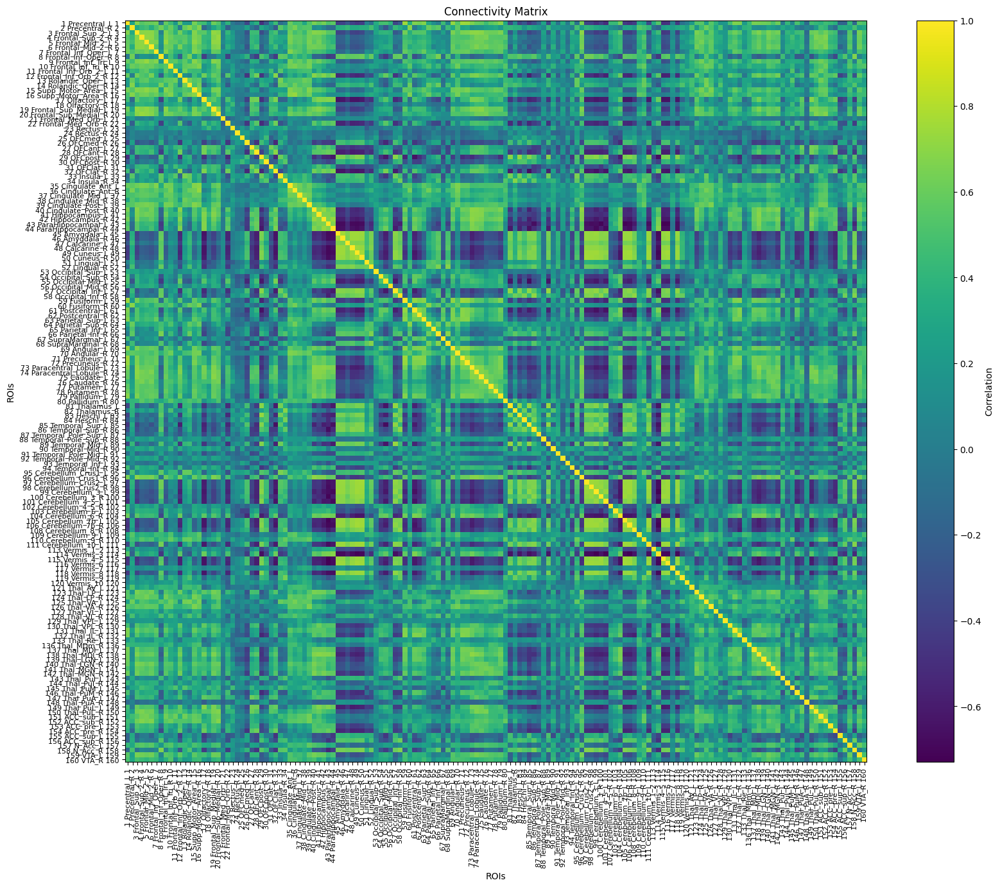

In [7]:

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))


plt.imshow(CN_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()

np.save('CN_matrix.npy', CN_matrix)

In [8]:
del connectivity_matrix
del time_series
del correlation_measure
del correlation_matrices

NameError: name 'correlation_matrices' is not defined

In [9]:


# EMCI patient


dicom_folder = "/Users/mariamannone/Downloads/ADNI 8/012_S_4012/Resting_State_fMRI/2013-05-16_11_59_31.0/I372938"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_EMCI"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]


# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)



/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.08160129127576196630'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


In [10]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_EMCI/output.nii.gz/501_resting_state_fmri.nii.gz"

#fmri_img = nib.load(nifti_file)

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]



# to check which ROIs are missing:

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Identify all ROIs from the atlas
all_rois = np.arange(len(roi_names))

# Determine missing ROIs
missing_rois = np.setdiff1d(all_rois, non_empty_indices)

# Print the missing ROIs
print("Missing ROIs indices:", missing_rois)
print("Missing ROIs names:", [roi_names[i] for i in missing_rois])

Missing ROIs indices: [160 161 162 163 164 165 166 167 168 169]
Missing ROIs names: ['161 SN_pc_L 161', '162 SN_pc_R 162', '163 SN_pr_L 163', '164 SN_pr_R 164', '165 Red_N_L 165', '166 Red_N_R 166', '167 LC_L 167', '168 LC_R 168', '169 Raphe_D 169', '170 Raphe_M 170']


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170, 142}. Label image only contains 161 labels (including background).
  warnings.warn(


In [11]:

# Filtering them out:

rois_to_filter_out = [166, 167, 168, 169, 106, 111, 121, 133, 134, 164, 170, 161, 162, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169]

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_EMCI/output.nii.gz/501_resting_state_fmri.nii.gz"

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170, 142}. Label image only contains 161 labels (including background).
  warnings.warn(


In [12]:
EMCI_matrix = connectivity_matrix

In [13]:
del connectivity_matrix
del time_series
del correlation_measure
del correlation_matrices

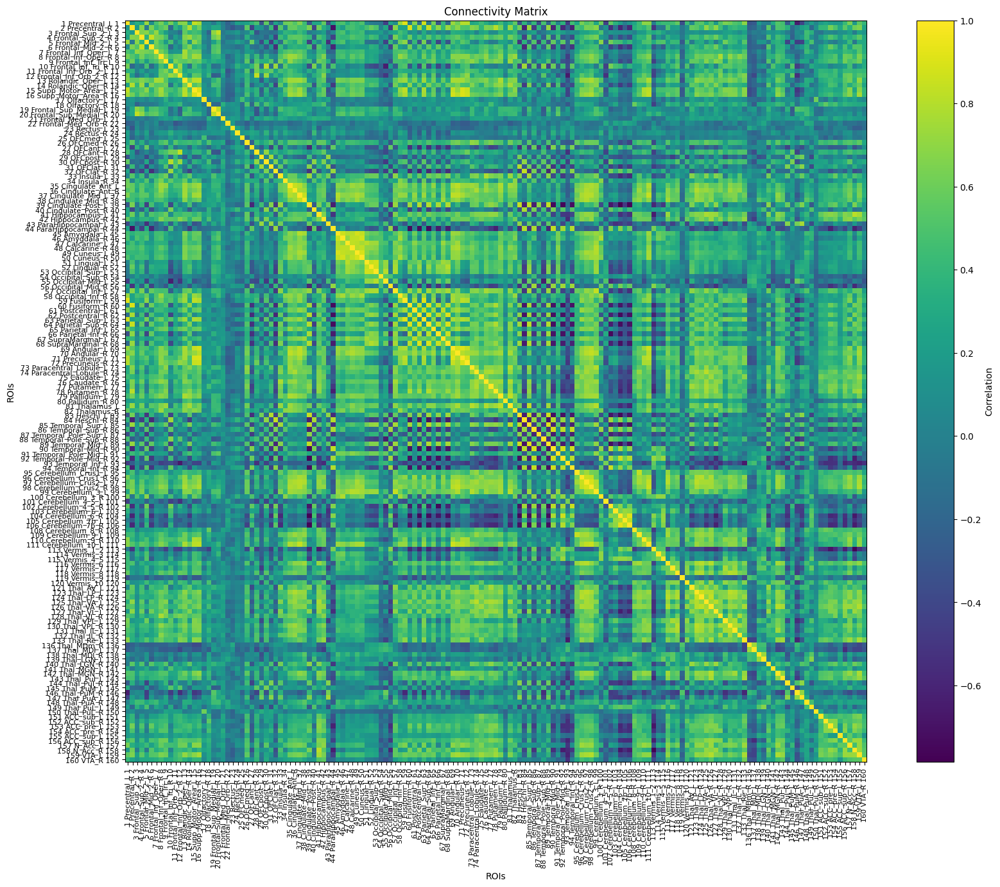

In [14]:
# Plot the connectivity matrix

# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))


plt.imshow(EMCI_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()



In [15]:


# LMCI patient


dicom_folder = "/Users/mariamannone/Downloads/ADNI 8/031_S_4203/Resting_State_fMRI/2013-09-23_14_53_03.0/I391665"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_LMCI"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]


# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)



/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06883781551784571636'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


In [16]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_LMCI/output.nii.gz/601_resting_state_fmri.nii.gz"

#fmri_img = nib.load(nifti_file)

# Create a masker using NiftiLabelsMasker
# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]




# to check which ROIs are missing:

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Identify all ROIs from the atlas
all_rois = np.arange(len(roi_names))

# Determine missing ROIs
missing_rois = np.setdiff1d(all_rois, non_empty_indices)

# Print the missing ROIs
print("Missing ROIs indices:", missing_rois)
print("Missing ROIs names:", [roi_names[i] for i in missing_rois])

Missing ROIs indices: [163 164 165 166 167 168 169]
Missing ROIs names: ['164 SN_pr_R 164', '165 Red_N_L 165', '166 Red_N_R 166', '167 LC_L 167', '168 LC_R 168', '169 Raphe_D 169', '170 Raphe_M 170']


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 134, 167}. Label image only contains 164 labels (including background).
  warnings.warn(


In [17]:
# Filtering them out:

rois_to_filter_out = [166, 167, 168, 169, 106, 111, 121, 133, 134, 164, 170, 161, 162, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169]


# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_LMCI/output.nii.gz/601_resting_state_fmri.nii.gz"

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]



/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 134, 167}. Label image only contains 164 labels (including background).
  warnings.warn(


In [18]:
LMCI_matrix = connectivity_matrix

In [19]:
del connectivity_matrix
del time_series
del correlation_measure
del correlation_matrices

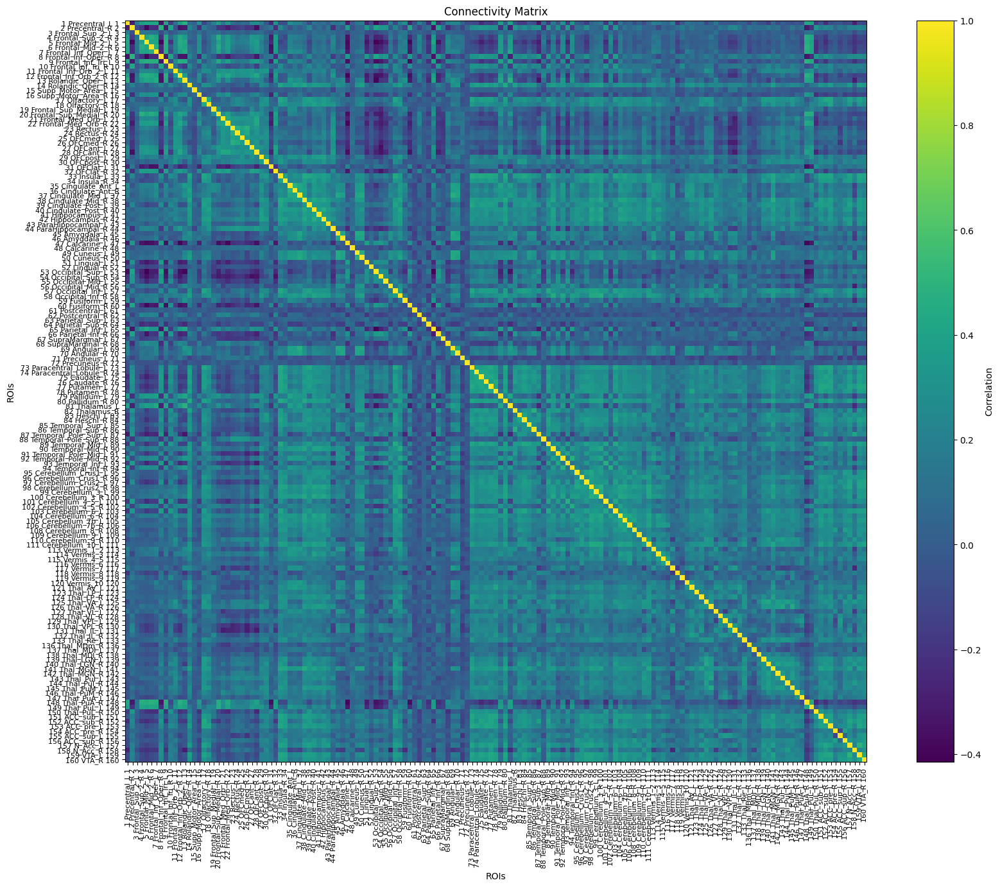

In [20]:
# Plot the connectivity matrix

plt.figure(figsize=(20, 15))


plt.imshow(LMCI_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()

In [21]:


# AD patient

# 018_S_4696 not 031_S_4203

dicom_folder = "/Users/mariamannone/Downloads/ADNI 10/018_S_4696/Resting_State_fMRI/2012-05-01_13_41_59.0/I301395"

output_folder = "/Users/mariamannone/Desktop/new_phd_/DICOM_AD"


# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Convert DICOM to NIfTI using dicom2nifti
dicom_files = [os.path.join(dicom_folder, file) for file in os.listdir(dicom_folder) if file.endswith(".dcm")]

# Load the DICOM data
dicom_data = [pydicom.dcmread(file) for file in dicom_files]


# Convert DICOM to NIfTI
nifti_file = os.path.join(output_folder, "output.nii.gz")
dicom2nifti.convert_directory(dicom_folder, nifti_file, compression=True, reorient=True)



/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.03063941057727378469'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06502357585872528492'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: '2.16.124.113543.6006.99.06130485761868266775'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)
/Users/mariamannone/test2/lib/python3.10/site-packages/pydico

In [22]:

# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_AD/output.nii.gz/601_resting_state_fmri.nii.gz"

#fmri_img = nib.load(nifti_file)

# Load the AAL atlas
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)


# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]

# Compute the connectivity matrix (correlation)
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform([time_series])

# Extract the connectivity matrix
connectivity_matrix = correlation_matrices[0]




# to check which ROIs are missing:

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Identify all ROIs from the atlas
all_rois = np.arange(len(roi_names))

# Determine missing ROIs
missing_rois = np.setdiff1d(all_rois, non_empty_indices)

# Print the missing ROIs
print("Missing ROIs indices:", missing_rois)
print("Missing ROIs names:", [roi_names[i] for i in missing_rois])

Missing ROIs indices: [162 163 164 165 166 167 168 169]
Missing ROIs names: ['163 SN_pr_L 163', '164 SN_pr_R 164', '165 Red_N_L 165', '166 Red_N_R 166', '167 LC_L 167', '168 LC_R 168', '169 Raphe_D 169', '170 Raphe_M 170']


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


In [23]:
# Filtering them out:

rois_to_filter_out = [166, 167, 168, 169, 106, 111, 121, 133, 134, 164, 170, 161, 162, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169]


# Define the path to the NIfTI file
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_AD/output.nii.gz/601_resting_state_fmri.nii.gz"

# masker
masker = input_data.NiftiLabelsMasker(labels_img=aal3_atlas_filename, standardize=True, memory='nilearn_cache')

time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter out the specified ROIs
filtered_indices = [i for i in non_empty_indices if i not in rois_to_filter_out]

# Filter the time series to include only the selected ROIs
filtered_time_series = time_series[:, filtered_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


In [24]:
AD_matrix = connectivity_matrix

In [25]:
del connectivity_matrix
del time_series
del correlation_measure
del correlation_matrices

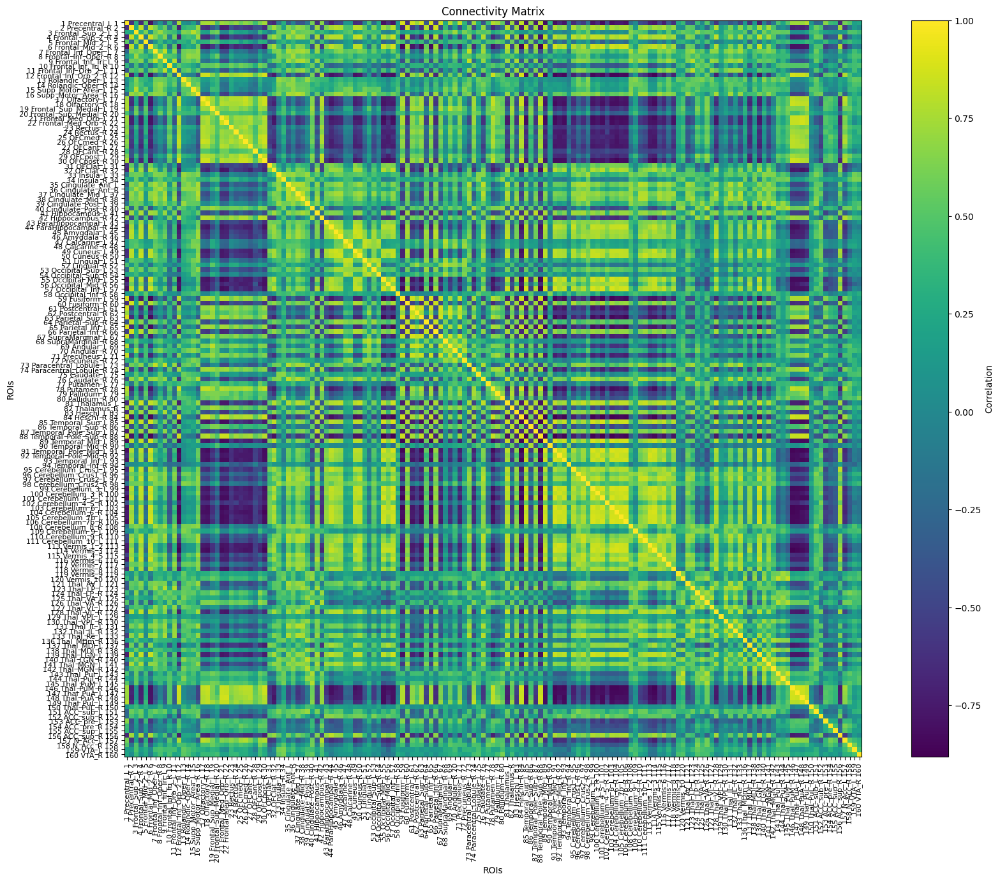

In [26]:
# Plot the connectivity matrix

# Adjust the figure size to fit all labels

plt.figure(figsize=(20, 15))

plt.imshow(AD_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation')
plt.title('Connectivity Matrix')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.show()


In [27]:
# Size check

In [28]:
print("Time series length for first dataset:", len(CN_matrix))
print("Time series length for second dataset:", len(EMCI_matrix))
print("Time series length for second dataset:", len(LMCI_matrix))
print("Time series length for second dataset:", len(AD_matrix))

print("Number of ROIs for first dataset:", CN_matrix.shape[1])
print("Number of ROIs for second dataset:", EMCI_matrix.shape[1])
print("Number of ROIs for second dataset:", LMCI_matrix.shape[1])
print("Number of ROIs for second dataset:", AD_matrix.shape[1])


size1 = CN_matrix.size
size2 = EMCI_matrix.size
size3 = LMCI_matrix.size
size4 = AD_matrix.size
print(size1, size2, size3, size4)

Time series length for first dataset: 155
Time series length for second dataset: 155
Time series length for second dataset: 155
Time series length for second dataset: 155
Number of ROIs for first dataset: 155
Number of ROIs for second dataset: 155
Number of ROIs for second dataset: 155
Number of ROIs for second dataset: 155
24025 24025 24025 24025


In [29]:
# And now, the three K-operators for the comparisons, filtered according to the ROIs for AD. But include the Vermis IX.

In [30]:
K1 = EMCI_matrix * np.linalg.inv(CN_matrix)

K2 = LMCI_matrix * np.linalg.inv(EMCI_matrix)

K3 = AD_matrix * np.linalg.inv(LMCI_matrix)

K4 = AD_matrix * np.linalg.inv(CN_matrix)


#K1 = EMCI_matrix @ np.linalg.inv(CN_matrix)

#K2 = LMCI_matrix @ np.linalg.inv(EMCI_matrix)

#K3 = AD_matrix @ np.linalg.inv(LMCI_matrix)

#K4 = AD_matrix @ np.linalg.inv(CN_matrix)

In [31]:
# Visualizing the filtered K according to an empirical threshold

<Figure size 2000x1500 with 0 Axes>

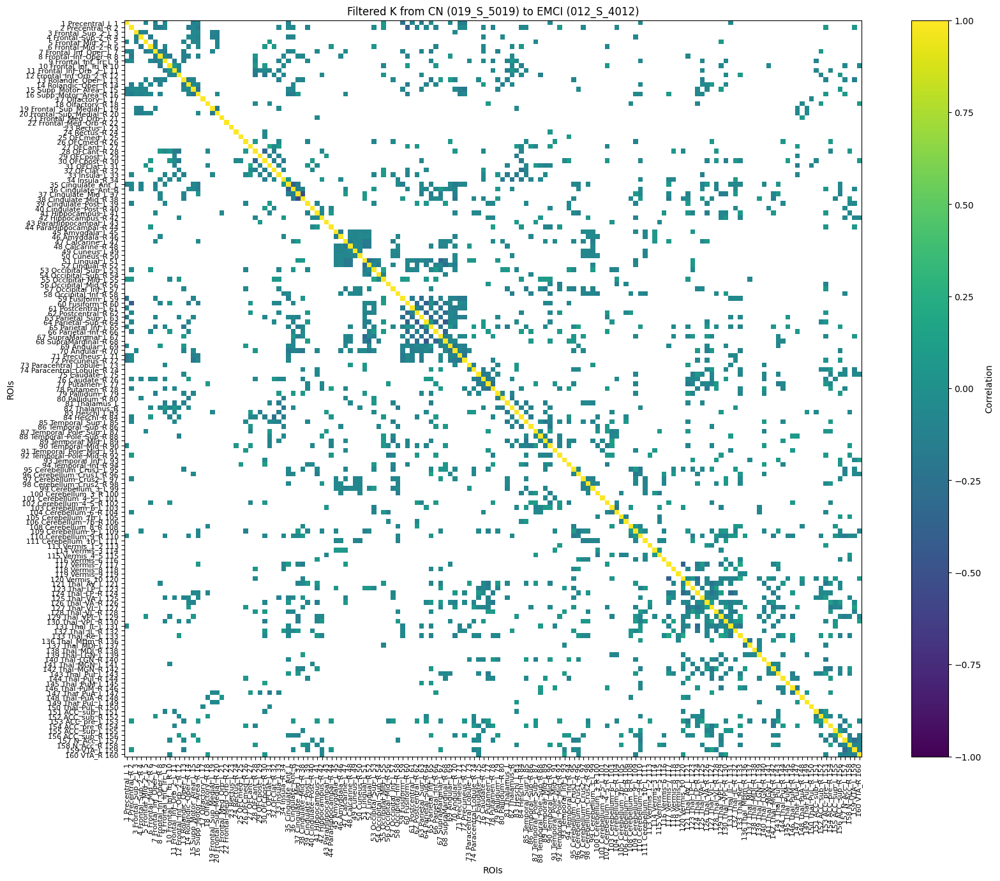

In [32]:
# Visualize K


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

#plt.imshow(K1, cmap='viridis', interpolation='nearest')
#plt.colorbar(label='Correlation')
#plt.title('K1: CN --> EMCI')


#plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
#plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

#plt.xlabel('ROIs')
#plt.ylabel('ROIs')
#plt.show()


# filtered K1

# Set the threshold
threshold = 0.05
#threshold = 1.5

# Create a boolean mask for the condition
mask1 = np.abs(K1) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix1 = np.where(mask1, K1, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -1, 1
plt.imshow(filtered_matrix1, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)
plt.colorbar(label='Correlation', aspect = 20)
plt.title('Filtered K from CN (019_S_5019) to EMCI (012_S_4012)')

#plt.xticks(ticks=np.arange(len(roi_names)), labels=roi_names, rotation=90, ha='right', fontsize=8)
#plt.yticks(ticks=np.arange(len(roi_names)), labels=roi_names, fontsize=8)

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_AAL3_from_CN_to_EMCI.png', dpi=300)
#plt.savefig('K_AAL3_from_CN_to_EMCI_product1.png', dpi=300)
plt.show()



In [33]:
# filtering out the smaller elements

In [34]:
# major effects: occipital and the other areas; hippocampus and cerebellum; temporal and cerebellum; cerebellum and vermis

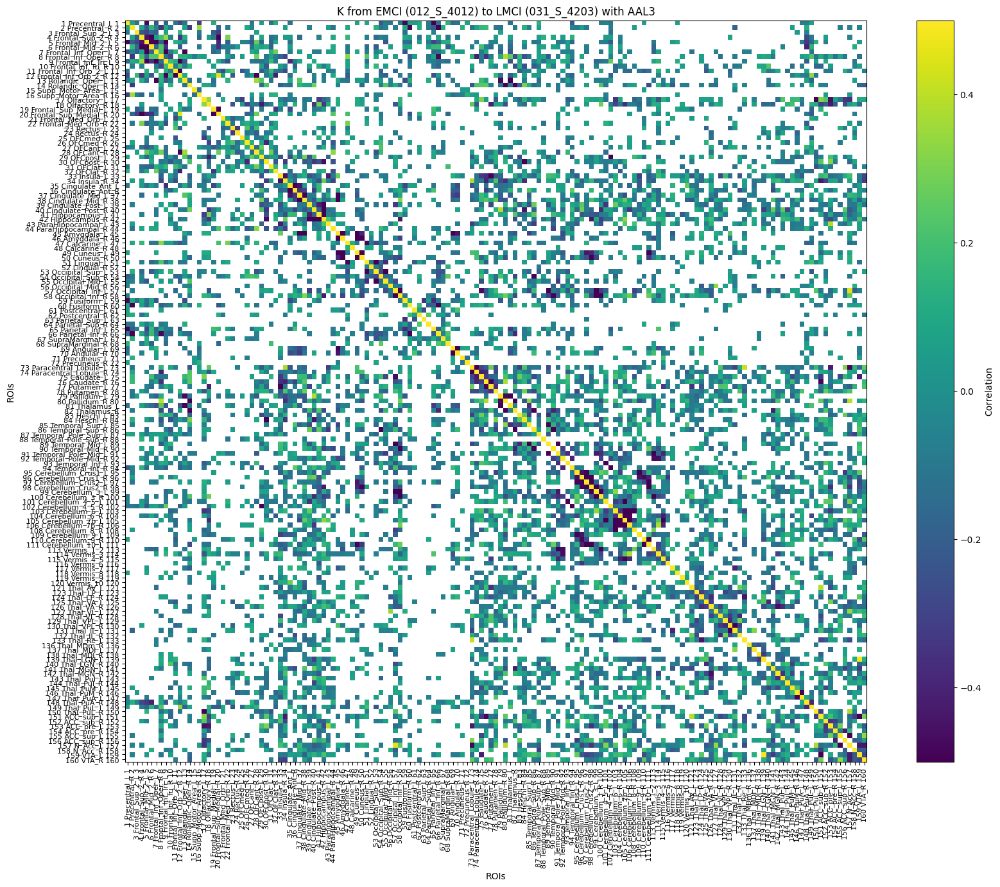

In [35]:

# Filtered K2


threshold = 0.05
#threshold = 2

# Create a boolean mask for the condition
mask2 = np.abs(K2) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix2 = np.where(mask2, K2, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -0.5, 0.5
plt.imshow(filtered_matrix2, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.colorbar(label='Correlation')
plt.title('K from EMCI (012_S_4012) to LMCI (031_S_4203) with AAL3')


plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_from_EMCI_to_LMCI_AAL3.png', dpi=300)
#plt.savefig('K_from_EMCI_to_LMCI_AAL3_product1.png', dpi=300)
plt.show()

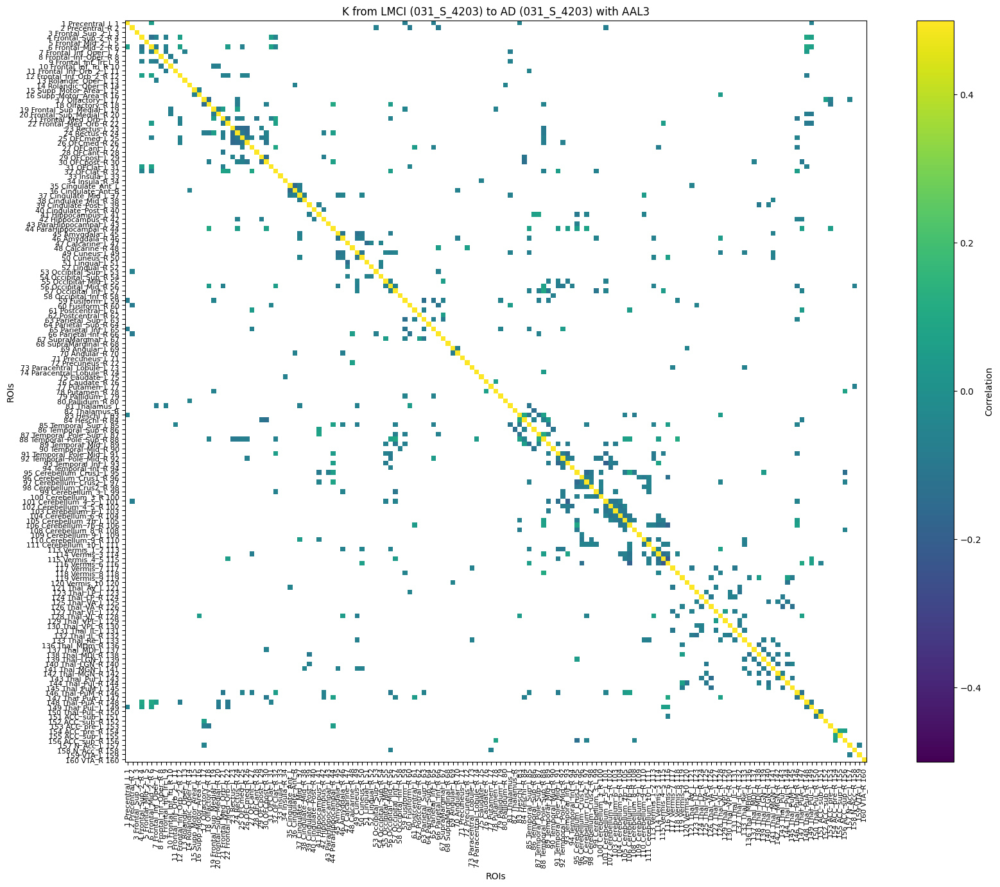

In [36]:
# # Filtered K3

threshold = 0.05
#threshold = 2

# Create a boolean mask for the condition
mask3 = np.abs(K3) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix3 = np.where(mask3, K3, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -0.5, 0.5
plt.imshow(filtered_matrix3, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.colorbar(label='Correlation')
plt.title('K from LMCI (031_S_4203) to AD (031_S_4203) with AAL3')


plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
plt.savefig('K_from_LMCI_to_AD_AAL3.png', dpi=300)
#plt.savefig('K_from_LMCI_to_AD_AAL3_product1.png', dpi=300)
plt.show()

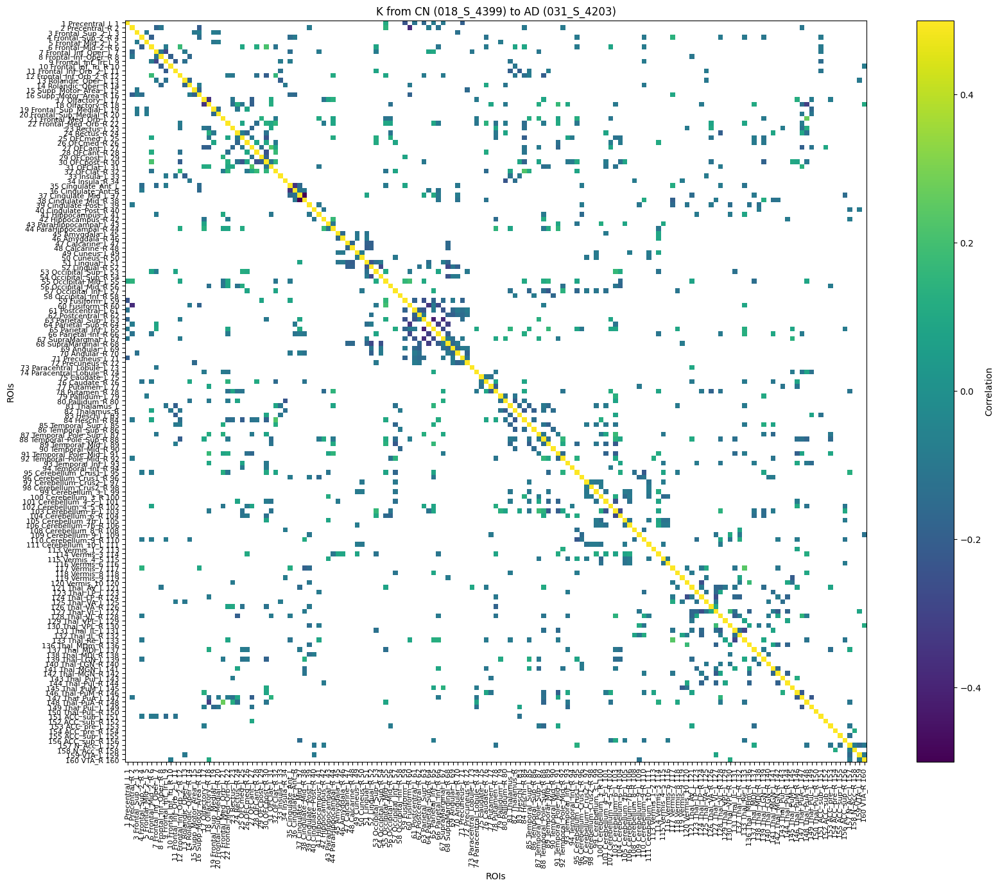

In [44]:

# Filtered K4



#threshold = 0.05
threshold = 0.08
#threshold = 3

# Create a boolean mask for the condition
mask4 = np.abs(K4) >= threshold  # True where absolute value is >= threshold

# Approach 2: Create a new matrix with only the elements >= 3, others as NaN (optional)
filtered_matrix4 = np.where(mask4, K4, np.nan)  # Or use another value like 0

# Display the filtered matrices


# Adjust the figure size to fit all labels
plt.figure(figsize=(20, 15))

vmin, vmax = -0.5, 0.5
plt.imshow(filtered_matrix4, cmap='viridis', interpolation='nearest', vmin=vmin, vmax=vmax)

plt.colorbar(label='Correlation')
plt.title('K from CN (018_S_4399) to AD (031_S_4203)')

plt.xticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], rotation=90, fontsize=8)
plt.yticks(ticks=np.arange(len(filtered_indices)), labels=[roi_names[i] for i in filtered_indices], fontsize=8)

plt.xlabel('ROIs')
plt.ylabel('ROIs')
#plt.savefig('K_from_CN_to_AD_AAL3.png', dpi=300)
#plt.savefig('K_from_CN_to_AD_AAL3_product1.png', dpi=300)

#plt.savefig('K_from_CN_to_AD_AAL3.svg', format='svg')
plt.savefig('K_from_CN_to_AD_AAL3_product2.svg', format='svg')
plt.savefig('K_from_CN_to_AD_AAL3_product2.pdf')

plt.show()


In [38]:
# Change the choice of ROIs, and add Amygdala and Vermis_9

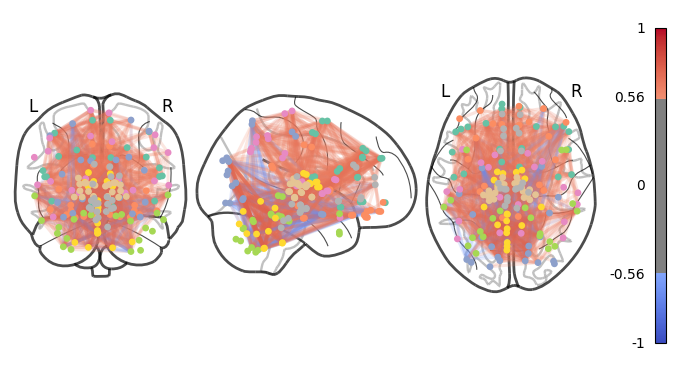

In [39]:
from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_CN/output.nii.gz/501_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}


# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="90%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome.png', dpi=300)
plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {133, 134, 167, 168, 170, 142}. Label image only contains 161 labels (including background).
  warnings.warn(


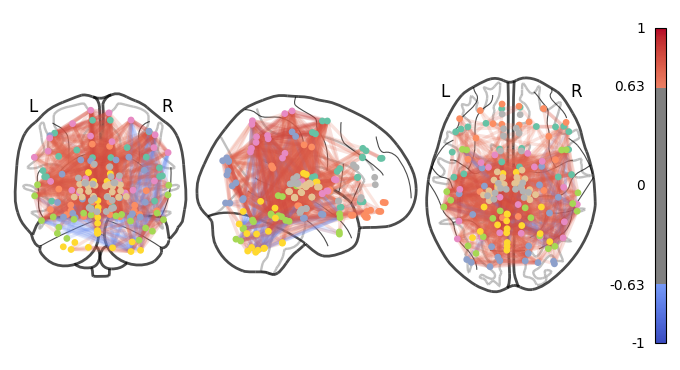

In [40]:
from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_EMCI/output.nii.gz/501_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}


# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="90%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome.png', dpi=300)
plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 134, 167}. Label image only contains 164 labels (including background).
  warnings.warn(


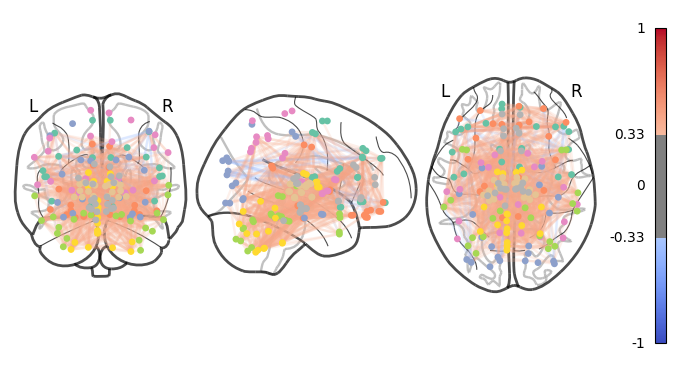

In [41]:
from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_LMCI/output.nii.gz/601_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}


# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="90%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome.png', dpi=300)
plt.show()


/Users/mariamannone/test2/lib/python3.10/site-packages/nilearn/maskers/nifti_labels_masker.py:805: UserWarning: After resampling the label image to the data image, the following labels were removed: {168, 170, 134, 167}. Label image only contains 163 labels (including background).
  warnings.warn(


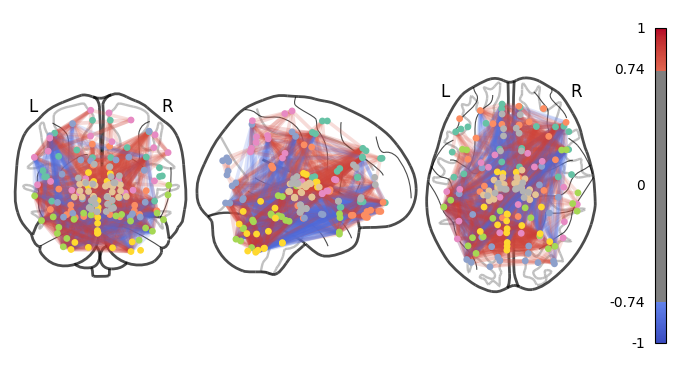

In [42]:
from nilearn import input_data, plotting, connectome
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Define the path to the NIfTI file and AAL3 atlas
nifti_file = "/Users/mariamannone/Desktop/new_phd_/DICOM_AD/output.nii.gz/601_resting_state_fmri.nii.gz"
aal3_atlas_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.gz'
aal3_labels_filename = '/Users/mariamannone/Downloads/AAL3/AAL3v1.nii.txt'

# Load the AAL3 atlas image
atlas_img = nib.load(aal3_atlas_filename)

# Create a masker using the AAL3 atlas
masker = input_data.NiftiLabelsMasker(labels_img=atlas_img, standardize=True, memory='nilearn_cache')
time_series = masker.fit_transform(nifti_file)

# Identify non-empty ROIs (ROIs with non-zero time series)
non_empty_rois = np.any(time_series, axis=0)
non_empty_indices = np.where(non_empty_rois)[0]

# Filter the time series to include only non-empty ROIs
filtered_time_series = time_series[:, non_empty_indices]

# Compute the connectivity matrix
correlation_measure = connectome.ConnectivityMeasure(kind='correlation')
connectivity_matrix = correlation_measure.fit_transform([filtered_time_series])[0]

# Load the AAL3 labels
with open(aal3_labels_filename, 'r') as f:
    labels = f.read().splitlines()

# Obtain the coordinates of the ROIs from the atlas
coords = plotting.find_parcellation_cut_coords(labels_img=atlas_img)

# Filter coordinates to include only those for non-empty ROIs
filtered_coords = np.array([coords[i] for i in non_empty_indices])

# Define edge properties with transparency for edges
#edge_kwargs = {'alpha': 0.02}

# Plot the connectome
edge_properties = {
    'alpha': 0.2 # 0 is completely transparent, 1 is opaque
}


# Plot the connectome with an edge threshold of the top 80% strongest edges
# and set edge_vmin and edge_vmax directly
node_size = 15  # Adjust this value to change node size

plotting.plot_connectome(
    connectivity_matrix,
    filtered_coords,
    edge_threshold="90%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('baseline_connectome.png', dpi=300)
plt.show()


In [ ]:
# printing only the links where K is acting more; according to the code of June 13

In [ ]:
# June 14

[[1.         0.         0.         ... 0.         0.54903686 0.        ]
 [0.         1.         0.         ... 0.         0.2552322  0.        ]
 [0.         0.         1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.         0.        ]
 [0.54903686 0.2552322  0.         ... 0.         1.         0.        ]
 [0.         0.         0.         ... 0.         0.         1.        ]]


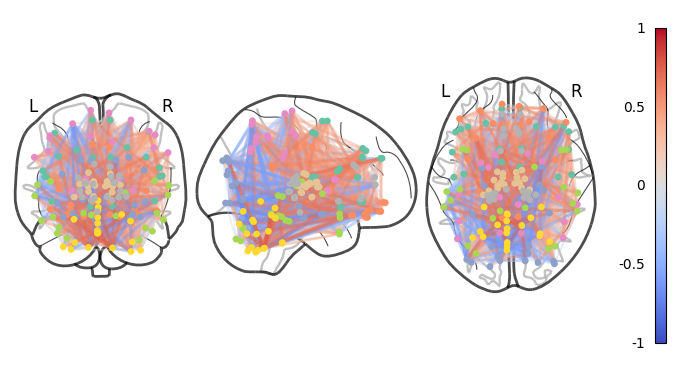

In [58]:
# June 14

# print the connectome for CN

# identify which ROIs are above threshold in K

threshold = 0.01

rois_above_threshold = np.argwhere(K1 > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(CN_matrix, dtype=bool) # change here

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, CN_matrix, 0) # not the whole one, connectivity_matrix # change here
filtered_coords_selected = filtered_coords[list(rois_set_)]


print(selection_connectivity_matrix)

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.4 # 0 is completely transparent, 1 is opaque
}

#CN_matrix
#EMCI_matrix
#LMCI_matrix
#AD_matrix

plotting.plot_connectome(
    selection_connectivity_matrix,
    #CN_matrix, # CHANGE it back!
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_connectome_CN.pdf')
plt.show()



[[1.         0.15377562 0.         ... 0.         0.5493396  0.40112892]
 [0.15377562 1.         0.18542747 ... 0.         0.         0.2664805 ]
 [0.         0.18542747 1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 1.         0.         0.        ]
 [0.5493396  0.         0.         ... 0.         1.         0.        ]
 [0.40112892 0.2664805  0.         ... 0.         0.         1.        ]]


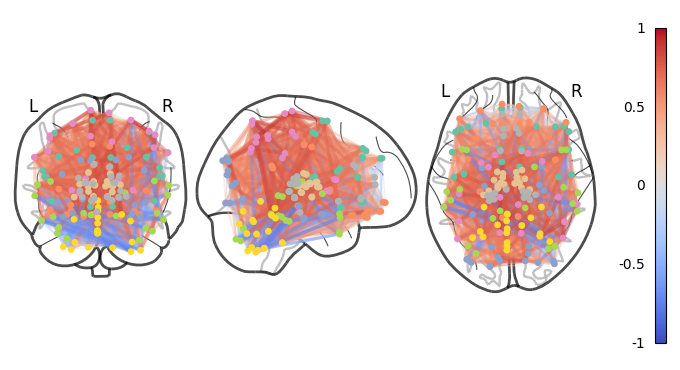

In [59]:
# June 14

# print the connectome for EMCI

# identify which ROIs are above threshold in K

threshold = 0.01

rois_above_threshold = np.argwhere(K2 > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(EMCI_matrix, dtype=bool) # change here

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, EMCI_matrix, 0) # not the whole one, connectivity_matrix # change here
filtered_coords_selected = filtered_coords[list(rois_set_)]


print(selection_connectivity_matrix)

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.4 # 0 is completely transparent, 1 is opaque
}

#CN_matrix
#EMCI_matrix
#LMCI_matrix
#AD_matrix

plotting.plot_connectome(
    selection_connectivity_matrix,
    #EMCI_matrix, # CHANGE it back!
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_connectome_EMCI.pdf')
plt.show()



[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]
 [0. 0. 0. ... 0. 0. 1.]]


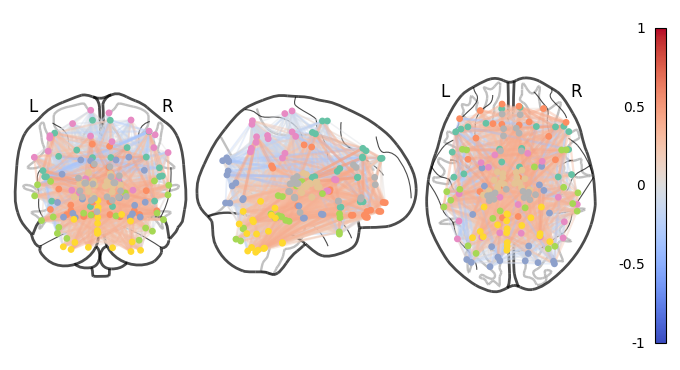

In [60]:
# June 14

# print the connectome for LMCI

# identify which ROIs are above threshold in K

threshold = 0.01

rois_above_threshold = np.argwhere(K3 > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(LMCI_matrix, dtype=bool) # change here

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, LMCI_matrix, 0) # not the whole one, connectivity_matrix # change here
filtered_coords_selected = filtered_coords[list(rois_set_)]


print(selection_connectivity_matrix)

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.4 # 0 is completely transparent, 1 is opaque
}

#CN_matrix
#EMCI_matrix
#LMCI_matrix
#AD_matrix

plotting.plot_connectome(
    selection_connectivity_matrix,
    #LMCI_matrix, # CHANGE it back!
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_connectome_LMCI.pdf')
plt.show()



[[ 1.         -0.6188914   0.         ...  0.          0.
   0.        ]
 [-0.6188914   1.          0.         ...  0.          0.14962776
   0.        ]
 [ 0.          0.          1.         ...  0.          0.
   0.        ]
 ...
 [ 0.          0.          0.         ...  1.          0.
   0.        ]
 [ 0.          0.14962776  0.         ...  0.          1.
   0.        ]
 [ 0.          0.          0.         ...  0.          0.
   1.        ]]


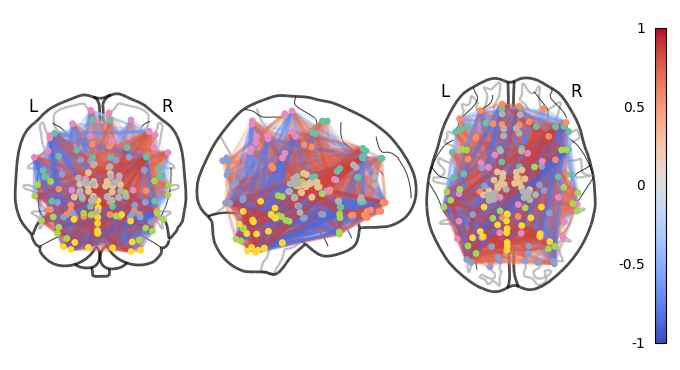

In [61]:
# June 14

# print the connectome for AD

# identify which ROIs are above threshold in K

threshold = 0.01

rois_above_threshold = np.argwhere(K4 > threshold)
rois_set_ = set(rois_above_threshold.flatten())

# Store them
#roi_names_selected = [f'ROI_{i}' for i in range(162)] # filtered_coords
roi_names_selected = [f'ROI_{i}' for i in non_empty_indices]
stored_rois = {roi_names_selected[i] for i in rois_set_}

# Filter the connectivity matrix accordingly

# Create a boolean mask for filtering the connectivity matrix
mask_new = np.zeros_like(AD_matrix, dtype=bool) # change here

for (i, j) in rois_above_threshold:
    if roi_names_selected[i] in stored_rois and roi_names_selected[j] in stored_rois:
        mask_new[i, j] = True

selection_connectivity_matrix = np.where(mask_new, AD_matrix, 0) # not the whole one, connectivity_matrix # change here
filtered_coords_selected = filtered_coords[list(rois_set_)]


print(selection_connectivity_matrix)

# visualize the connectome with this filtering:

node_size = 15  # Adjust this value to change node size

edge_properties = {
    'alpha': 0.4 # 0 is completely transparent, 1 is opaque
}

#CN_matrix
#EMCI_matrix
#LMCI_matrix
#AD_matrix

plotting.plot_connectome(
    selection_connectivity_matrix,
    #AD_matrix, # CHANGE it back!
    filtered_coords_selected,
    edge_threshold="0%",
    edge_cmap='coolwarm',  # Use a colormap for edges
    edge_vmin=-1,  # Set the minimum edge value for colormap scaling
    edge_vmax=1,  # Set the maximum edge value for colormap scaling
    edge_kwargs=edge_properties,
    colorbar=True,
    node_size=node_size
)

# Save the plot
plt.savefig('ADNI_AAL3_connectome_AD.pdf')
plt.show()



In [51]:
from nilearn import datasets

# Fetch the AAL atlas
aal = datasets.fetch_atlas_aal()

# Extract the labels from the AAL atlas
atlas_labels = aal.labels

# List of ROIs to find indices for
roi_names_selection = [
    "Occipital_Mid_R", "Occipital_Inf_L", "Occipital_Inf_R", "Fusiform_L", "Postcentral_R", 
    "Supramarginal_R", "Cerebelum_Crus1_R", "Cerebelum_3_L", "Cerebelum_4_5_R", "Cerebelum_8_L",
    "Cerebelum_9_R", "Cerebelum_10_L", "Cerebelum_10_R", "Vermis_6", "Vermis_7", "Vermis_8", 
    "Cingulum_Post_R", "Frontal_Inf_Tri_R", "Precentral_R", "Frontal_Sup_L", "Heschl_L", 
    "Pallidum_L", "Parietal_Inf_L", "Occipital_Mid_L", "Hippocampus_L", "Hippocampus_R",
    "ParaHippocampal_L", "Temporal_Mid_L", "Temporal_Mid_R", "ParaHippocampal_R", "Amygdala", "Vermis_9"
]

# Get the indices for the specified ROI names
roi_indices_selection = [i for i, label in enumerate(atlas_labels) if label in roi_names_selection]

print("Indices for the specified ROIs:", roi_indices_selection)


Indices for the specified ROIs: [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113, 114]


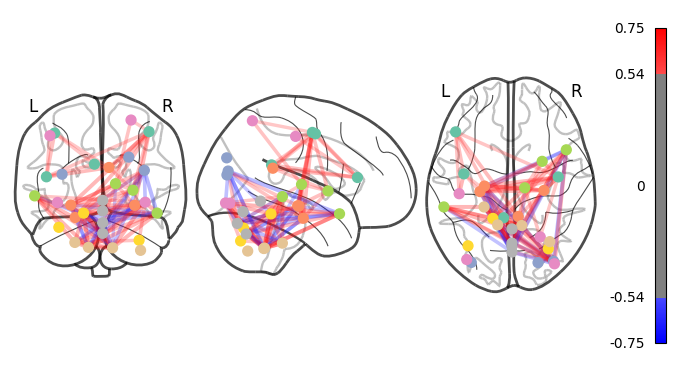

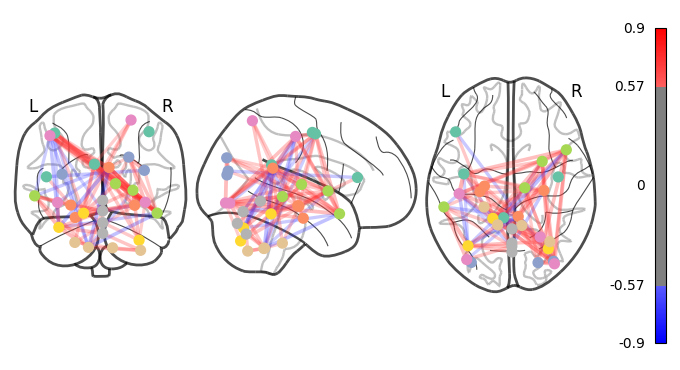

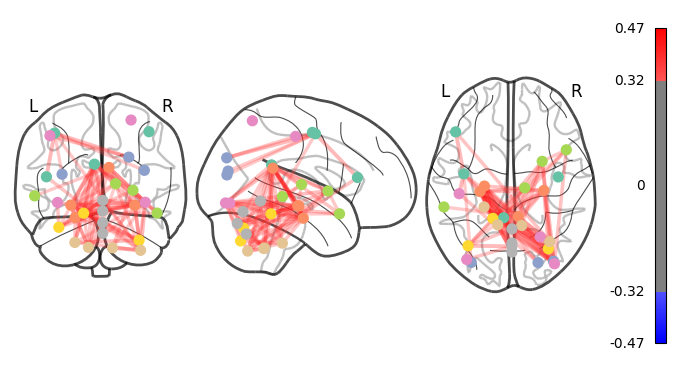

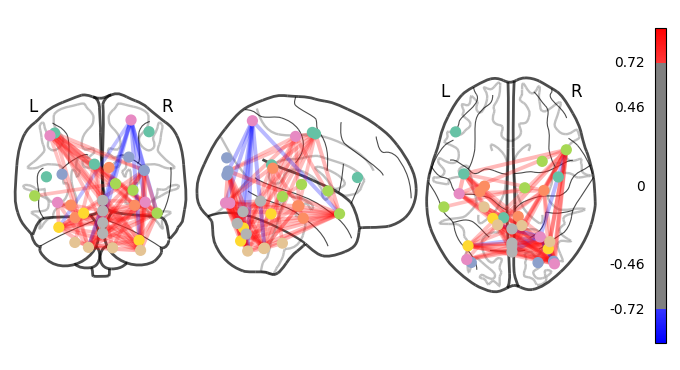

In [54]:
import numpy as np
from nilearn import datasets, plotting, input_data, connectome
import nibabel as nib

# Fetch the AAL atlas
aal_atlas = datasets.fetch_atlas_aal()

# Get the map and labels from the AAL atlas
atlas_filename = aal_atlas['maps']
atlas_labels = aal_atlas['labels']

# Load the NIfTI image to access coordinates
atlas_img = nib.load(atlas_filename)

# The coordinates for each ROI are obtained from the affine transformation
# and the indices where the atlas has a specific ROI value
unique_roi_values = np.unique(atlas_img.get_fdata())
roi_coords = []

# Find the center of each ROI in the atlas
for roi_value in unique_roi_values:
    if roi_value != 0:  # Skip background (value 0)
        roi_indices = np.argwhere(atlas_img.get_fdata() == roi_value)
        roi_center = np.mean(roi_indices, axis=0)  # Compute the mean position
        roi_coords.append(nib.affines.apply_affine(atlas_img.affine, roi_center))

# Now you have the coordinates for each ROI
roi_indices = [1, 2, 13, 35, 36, 37, 38, 39, 50, 51, 52, 53, 54, 57, 60, 74, 78, 84, 85, 91, 94, 97, 102, 105, 106, 107, 111, 112, 113, 114]

# Extract only the coordinates that correspond to your selection
selected_coords = [roi_coords[i - 1] for i in roi_indices]

# Example: Filter a connectivity matrix to these indices
# Assuming you have a connectivity matrix
# connectivity_matrix = np.random.rand(116, 116)  # Replace with your matrix
CN_matrix_partial = CN_matrix[np.ix_(roi_indices, roi_indices)]
EMCI_matrix_partial = EMCI_matrix[np.ix_(roi_indices, roi_indices)]
LMCI_matrix_partial = LMCI_matrix[np.ix_(roi_indices, roi_indices)]
AD_matrix_partial = AD_matrix[np.ix_(roi_indices, roi_indices)]

edge_properties = {
    'alpha': 0.3 # 0 is completely transparent, 1 is opaque
}

# Plot the filtered connectome with the selected coordinates
plotting.plot_connectome(CN_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('CN_matrix_partial_baseline_partial_connectome_ADNI_018_S_4399.png', dpi=300)
plotting.show()

plotting.plot_connectome(EMCI_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('EMCI_matrix_partial_baseline_partial_connectome_ADNI_012_S_4012.png', dpi=300)
plotting.show()

plotting.plot_connectome(LMCI_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('LMCI_matrix_partial_baseline_partial_connectome_ADNI_031_S_4203.png', dpi=300)
plotting.show()

plotting.plot_connectome(AD_matrix_partial, selected_coords, edge_threshold="80%", edge_kwargs=edge_properties, colorbar=True)
plt.savefig('AD_matrix_partial_baseline_partial_connectome_ADNI_018_S_4696.png', dpi=300)
plotting.show()


In [ ]:
# female

In [ ]:
# test patient

In [ ]:
# prediction with MLP